# Project 6: Object Recognition
---

## Assignments

Please, edit your report by fulfilling the following list of assignments.

**Introduction.** Short summary of the goals of the  project. The sections composing the report.

**Section 1. Data loading and visualization**
* 1a. Download the data and visualize an image from the dataset;
* 1b. Write a custom dataset for Penn-Fudan;
* 1c. Visualize images with ground truth.

**Section 2. Data preparation**
* 2a. Define a tronsformer function;
* 2b. Define the training set and test set.

**Section 3. Preparation of the training**
* 3a. The NN model: download and adjust;
* 3b. Define hyperparameters.

**Section 4. Training execution**
* 4a. Training;
* 4b. Retrieve the loss data during training.

**Section 5. Test**
* 5a. Plot training losses;
* 5b. Visualize the predicted bounding boxes.

**Section 6. Results, observations and conclusions**

**Full code**



## Introduction

TODO

## 1. Data loading and preparation

Install the `pycocotools` library. It will be used for computing the evaluation metrics (accuracy) using the COCO metric for intersection over union. Then, import the libraries.

In [ ]:
!pip install cython
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-n11ouugz
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-n11ouugz
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=263918 sha256=efbdce04833e5c56ec397b9c5d8df757fd7ad2adc2ca093bf77286b8f6ca3d86
  Stored in directory: /tmp/pip-ephem-wheel-cache-a9i5hloc/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools
  Found existing installation: pycocotools 2.0.2
    Uninstalling pycocotools-2.0.2:
      Successfully uninstalled pycocotools-2.0.2


In [ ]:
%%shell

# Download TorchVision repo to use some files from
# references/detection
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.9.0

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/coco_eval.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

Cloning into 'vision'...
remote: Enumerating objects: 22951, done.
remote: Counting objects: 100% (413/413), done.
remote: Compressing objects: 100% (148/148), done.
remote: Total 22951 (delta 280), reused 367 (delta 257), pack-reused 22538
Receiving objects: 100% (22951/22951), 29.71 MiB | 26.66 MiB/s, done.
Resolving deltas: 100% (16968/16968), done.
Note: checking out 'v0.9.0'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at 01dfa8ea add custom user agent for download_url (#3499)


In [ ]:
# imports
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import random
from torchvision.datasets.utils import download_and_extract_archive
import os
import numpy as np
import torch
import torch.utils.data
from engine import train_one_epoch, evaluate
import utils
import transforms
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import pickle

### 1a. Download the data and visualize an image from the dataset
In this project we will use the [Penn-Fudan Database for Pedestrian Detection and Segmentation](https://www.cis.upenn.edu/~jshi/ped_html/).



#### Download and extract the data

In [ ]:
url = "https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip" #URL to download file from
root = "." #directory to place downloaded file in
download_and_extract_archive(url, root)


Extracting ./PennFudanPed.zip to .


#### Visualize an image and its corresponding segmentation mask

Using PIL, open an image from the dataset.

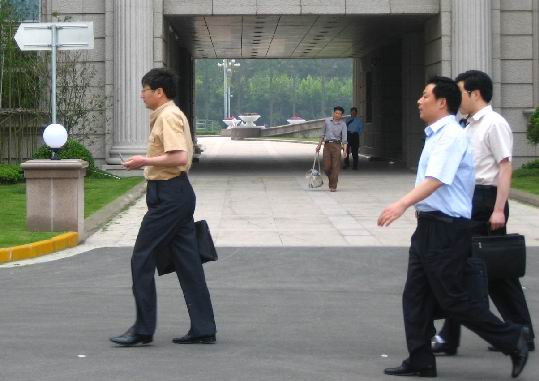

In [ ]:
image_path = 'PennFudanPed/PNGImages/FudanPed00007.png'
Image.open(image_path)

### 1b. Write a custom dataset for Penn-Fudan

Write a custom class that inherits from `torch.utils.data.Dataset` for defining the Penn-Fudan dataset.

In [ ]:
class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = Image.open(mask_path)

        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

Let's see how the outputs are structured for this dataset by instantiating a `PennFudanDataset` object and printing the first element of the dataset.

In [ ]:
dataset = PennFudanDataset('PennFudanPed/')
len(dataset)
dataset[6]

(<PIL.Image.Image image mode=RGB size=539x381 at 0x7FFB68DA0450>,
 {'area': tensor([29362., 45451.,  2520.]),
  'boxes': tensor([[111.,  68., 217., 345.],
          [377.,  75., 528., 376.],
          [316., 107., 346., 191.]]),
  'image_id': tensor([6]),
  'iscrowd': tensor([0, 0, 0]),
  'labels': tensor([1, 1, 1]),
  'masks': tensor([[[0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           ...,
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0]],
  
          [[0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           ...,
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0]],
  
          [[0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           ...,
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..

### 1c. Visualize images with ground truth

Define three functions: 
* `show_boxed_image` draws bounding boxes around pedestrians in an image;
* `show_area_image` draws area rectangles above pedestrians;
* `show_mask_image` constructs a tensor with all the segmentation masks of pedestrians in the image.

In [ ]:
def show_boxed_image(img : PennFudanDataset) -> ImageDraw:
    '''
    args: img -> PennFudanDataset object
    returns an ImageDraw image with bounding boxes around pedestrians.
    '''
    img_show = img[0] #get the PIL image
    img_coordinates = img[1].get("boxes") #get the bounding boxes coordinates

    # draw a rectangle (bounding box) following the coordinates
    for coords in img_coordinates:
        xmin = coords[0]
        ymin = coords[1]
        xmax = coords[2]
        ymax = coords[3]
        draw = ImageDraw.Draw(img_show)
        draw.rectangle([(xmin, ymin), (xmax, ymax)], outline ="lightgreen", width=5)

    return img_show


def show_area_image(img):
    '''
    args: img -> PennFudanDataset object
    returns an ImageDraw image with area rectangles over pedestrians.
    '''
    img_show = img[0] #get the PIL image
    img_coordinates = img[1].get("boxes") #get the bounding boxes coordinates
    img_areas = img[1].get("area") #get the area values

    fnt = ImageFont.truetype("~/usr/share/fonts/truetype/LiberationMono-Bold.ttf", 20)

    # draw a filled rectangle following the coordinates, and 
    # print the value of the area over each rectangle
    for i in range(len(img_areas)):
        xmin = img_coordinates[i][0]
        ymin = img_coordinates[i][1]
        xmax = img_coordinates[i][2]
        ymax = img_coordinates[i][3]
        draw = ImageDraw.Draw(img_show)
        draw.rectangle([(xmin, ymin), (xmax, ymax)], fill ="orange")
        draw.text(((xmax+xmin)/2-40, (ymin+ymax)/2), 
                  str(img_areas[i].item()), 
                  font = fnt,
                  fill="blue")

    return img_show


def show_mask_image(img):
    '''
    args: img -> PennFudanDataset object
    returns a tensor corresponding to the segmentation masks of pedestrians 
    in the image.
    '''
    masks = img[1].get("masks") #get the masks tensors

    # add each tensor (mask) onto the others. 
    # The result is a single tensor containing all the segmentation masks
    result = torch.zeros(masks.size()[1], masks.size()[2])
    for i in range(len(masks)):
        result += masks[i]

    return result

Create a list of four random integers.

In [ ]:
NUM_OF_IMGS = 4
# create a list of NUM_OF_IMGS integers
image_ids = random.sample(range(len(dataset)), NUM_OF_IMGS)

Visualize 16 images:
* 1st row: 4 random images from the dataset (use the list of 4 random numbers);
* 2nd row: the same 4 images, with bounding boxes;
* 3rd row: the same 4 images, with areas;
* 4th row: the segmentation masks of the same 4 images.

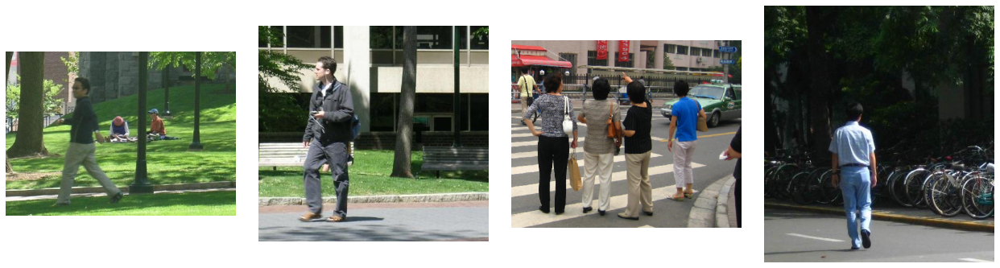

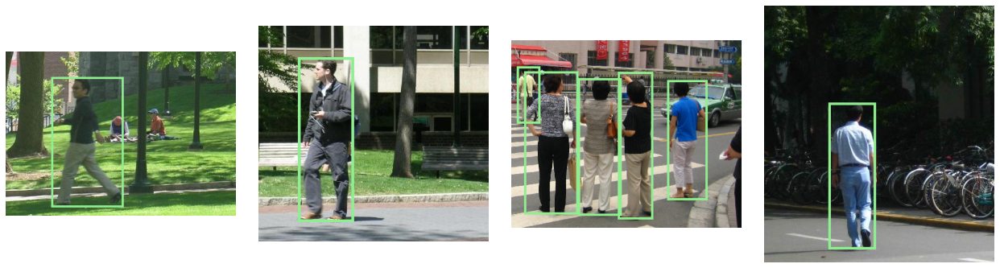

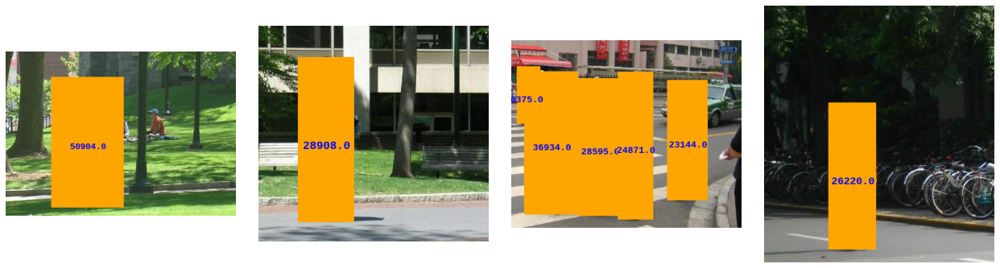

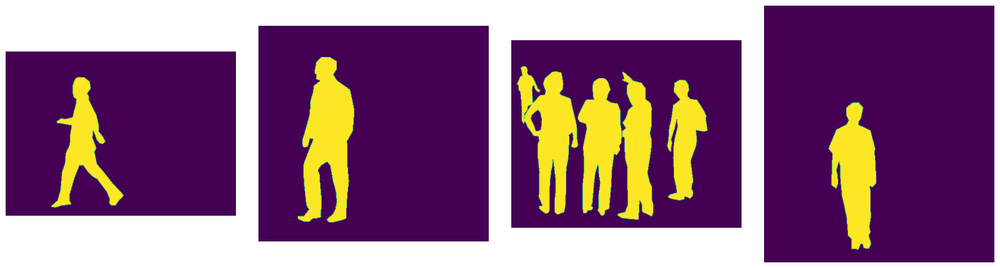

In [ ]:
# visualize 4 original images
figure = plt.figure(figsize=(22, 22))
cols, rows = 4, 1
for i in range(NUM_OF_IMGS):
    idx = image_ids[i]
    figure.add_subplot(rows, cols, i+1)
    plt.imshow(dataset[idx][0])
    plt.axis('off')
plt.subplots_adjust(hspace=0.1, wspace=0.1)
plt.show()

# visualize 4 images with bounding boxes
figure = plt.figure(figsize=(22, 22))
cols, rows = 4, 1
for i in range(NUM_OF_IMGS):
    idx = image_ids[i]
    figure.add_subplot(rows, cols, i+1)
    plt.imshow(show_boxed_image(dataset[idx]))
    plt.axis('off')
plt.subplots_adjust(hspace=0.1, wspace=0.1)
plt.show()

# visualize 4 images with areas
figure = plt.figure(figsize=(22, 22))
cols, rows = 4, 1
for i in range(NUM_OF_IMGS):
    idx = image_ids[i]
    figure.add_subplot(rows, cols, i+1)
    plt.imshow(show_area_image(dataset[idx]))
    plt.axis('off')
plt.subplots_adjust(hspace=0.1, wspace=0.1)
plt.show()

# visualize 4 images with segmentation masks
figure = plt.figure(figsize=(22, 22))
cols, rows = 4, 1
for i in range(NUM_OF_IMGS):
    idx = image_ids[i]
    figure.add_subplot(rows, cols, i+1)
    plt.imshow(show_mask_image(dataset[idx]))
    plt.axis('off')
plt.subplots_adjust(hspace=0.1, wspace=0.1)
plt.show()

## 2. Data preparation

### 2a. Define a transformer function

Write a function that enhances the training set by doing data transformation and augmentation, namely horizontal flip of images.

In [ ]:
def get_transform(train):
    transforms_to_apply = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms_to_apply.append(transforms.ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms_to_apply.append(transforms.RandomHorizontalFlip(0.5))
    return transforms.Compose(transforms_to_apply)

### 2b. Define the training set and test set

Instantiate the training and testing data classes and assign them to `DataLoader`.

In [ ]:
# use our dataset and defined transformations
train_set = PennFudanDataset('PennFudanPed', get_transform(train=True))
test_set = PennFudanDataset('PennFudanPed', get_transform(train=False))

# split the dataset in train and test set
torch.manual_seed(1)
indices = torch.randperm(len(train_set)).tolist()
train_set = torch.utils.data.Subset(train_set, indices[:100])
test_set = torch.utils.data.Subset(test_set, indices[100:120])

# define training and validation data loaders
train_loader = torch.utils.data.DataLoader(
    train_set, 
    batch_size=2, 
    shuffle=True, 
    num_workers=2,
    collate_fn=utils.collate_fn)

test_loader = torch.utils.data.DataLoader(
    test_set, 
    batch_size=1, 
    shuffle=False, 
    num_workers=2,
    collate_fn=utils.collate_fn)

# check the size of the training set and the test set
print("Training set: {} images\nTest set: {} images".format(len(train_set), len(test_set)))

Training set: 100 images
Test set: 20 images


## 3. Preparation of the training

### 3a. The NN model: download and adjust

Define a `get_model` function to download a pre-trained model. Adjust its input layer to resize the images, and the last layer to output a number of classes that suits our dataset.

We will use a Faster R-CNN model with a Resnet-50 backbone.


In [ ]:
def get_model(num_classes):
    # load the model Faster R-CNN, pre-trained on COCO data
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
   
    return model

Instantiate the model and apply a resize on the images. The input images resolution must be 224x224 pixels.

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# our dataset has two classes only - background and person
NUM_CLASSES = 2

# get the model using our helper function
model = get_model(NUM_CLASSES)
#
grcnn = torchvision.models.detection.transform.GeneralizedRCNNTransform(min_size=224, 
                                                                        max_size=224, 
                                                                        image_mean=[0.485, 0.456, 0.406], 
                                                                        image_std=[0.229, 0.224, 0.225]
                                                                        )
model.transform = grcnn

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


### 3b. Define hyperparameters

Implement a Stochastic Gradient Descent optimizer with a learning rate of 0.0005, a momentum factor of 0.9, and a weight decay of 0.0005. Then, construct a learning rate scheduler which decreases the learning rate by 10 times every 3 epochs. Set the number of epochs at 10.

In [ ]:
# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by 
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

num_epochs = 10

## 4. Training execution

At the beginning of the notebook, we copied some helper functions to simplify training and evaluating models in `references/detection/`.

### 4a. Training

Train the model for 10 epochs, evaluating at the end of every epoch.

In [ ]:
# move model to the right device
model.to(device)

metric_collector = []

for epoch in range(num_epochs):
    # train for one epoch, printing every 50 iterations
    metric_logger = train_one_epoch(model, optimizer, train_loader, device,
                                    epoch, print_freq=50)
    metric_collector.append(metric_logger)
    # update the learning rate
    lr_scheduler.step()

Epoch: [0]  [ 0/50]  eta: 0:00:35  lr: 0.000107  loss: 1.5178 (1.5178)  loss_classifier: 0.7362 (0.7362)  loss_box_reg: 0.4087 (0.4087)  loss_objectness: 0.3696 (0.3696)  loss_rpn_box_reg: 0.0033 (0.0033)  time: 0.7105  data: 0.1795  max mem: 536
Epoch: [0]  [49/50]  eta: 0:00:00  lr: 0.005000  loss: 0.2628 (0.5449)  loss_classifier: 0.0478 (0.2023)  loss_box_reg: 0.1587 (0.2437)  loss_objectness: 0.0377 (0.0872)  loss_rpn_box_reg: 0.0037 (0.0117)  time: 0.1090  data: 0.0076  max mem: 737
Epoch: [0] Total time: 0:00:06 (0.1251 s / it)
Epoch: [1]  [ 0/50]  eta: 0:00:20  lr: 0.005000  loss: 0.7619 (0.7619)  loss_classifier: 0.1875 (0.1875)  loss_box_reg: 0.3646 (0.3646)  loss_objectness: 0.1360 (0.1360)  loss_rpn_box_reg: 0.0737 (0.0737)  time: 0.4052  data: 0.2359  max mem: 737
Epoch: [1]  [49/50]  eta: 0:00:00  lr: 0.005000  loss: 0.1739 (0.2111)  loss_classifier: 0.0384 (0.0548)  loss_box_reg: 0.1133 (0.1291)  loss_objectness: 0.0063 (0.0153)  loss_rpn_box_reg: 0.0042 (0.0118)  time: 

### 4b. Retrieve the loss data during training

The task of object detection has more than one loss value, so during training these are the losses calculated at every epoch:
* `loss`: the sum of all losses;
* `loss_classifier`: measures the performance of the object classification for detected bounding boxes;
* `loss_box_reg`: measures the performance of the network for retrieving the coordinates of the ground truth bounding boxes;
* `loss_objectness`: measures the performance of the network for retrieving bounding boxes which contain an object; 
* `loss_rpn_box_reg`: measures the performance of the network for retrieving the region proposals.

Retrieve the `loss` and `loss_box_reg` metrics from the `metric_collector` and save them in a `metrics` list.

In [ ]:
loss_metric = []
loss_classifier_metric = []
loss_box_reg_metric = []
loss_objectness_metric = []
loss_rpn_box_reg_metric = []

for i in range(len(metric_collector)):
    # get the loss value
    loss = float(str(metric_collector[i].__getattr__("loss")).split(' ', 1)[0])
    # add the loss value to the 'loss_metric' list
    loss_metric.append(loss)

    # get the loss value
    loss_classifier = float(str(metric_collector[i].__getattr__("loss_classifier")).split(' ', 1)[0])
    # add the loss value to the 'loss_metric' list
    loss_classifier_metric.append(loss_classifier)

    # get the loss value
    loss_box_reg = float(str(metric_collector[i].__getattr__("loss_box_reg")).split(' ', 1)[0])
    # add the loss value to the 'loss_metric' list
    loss_box_reg_metric.append(loss_box_reg)

    # get the loss value
    loss_objectness = float(str(metric_collector[i].__getattr__("loss_objectness")).split(' ', 1)[0])
    # add the loss value to the 'loss_metric' list
    loss_objectness_metric.append(loss_objectness)

    # get the loss value
    loss_rpn_box_reg = float(str(metric_collector[i].__getattr__("loss_rpn_box_reg")).split(' ', 1)[0])
    # add the loss value to the 'loss_metric' list
    loss_rpn_box_reg_metric.append(loss_rpn_box_reg)

metrics = [loss_metric, 
           loss_classifier_metric, 
           loss_box_reg_metric, 
           loss_objectness_metric, 
           loss_rpn_box_reg_metric]

Save the metrics and the model.

In [ ]:
torch.save(model.state_dict(), "pedestrians_saved_model.pth")

with open('metrics.pickle', 'wb') as f:
    pickle.dump(metrics, f)

## 5. Test

Load the model and the metrics.

In [ ]:
loaded_model = get_model(num_classes = 2)
loaded_model.load_state_dict(torch.load("pedestrians_saved_model.pth"))
loaded_model.eval()

with open('metrics.pickle', 'rb') as f:
    metrics = pickle.load(f)

### 5a. Plot training losses

Plot the data of `loss` and `loss_box_reg` during training.

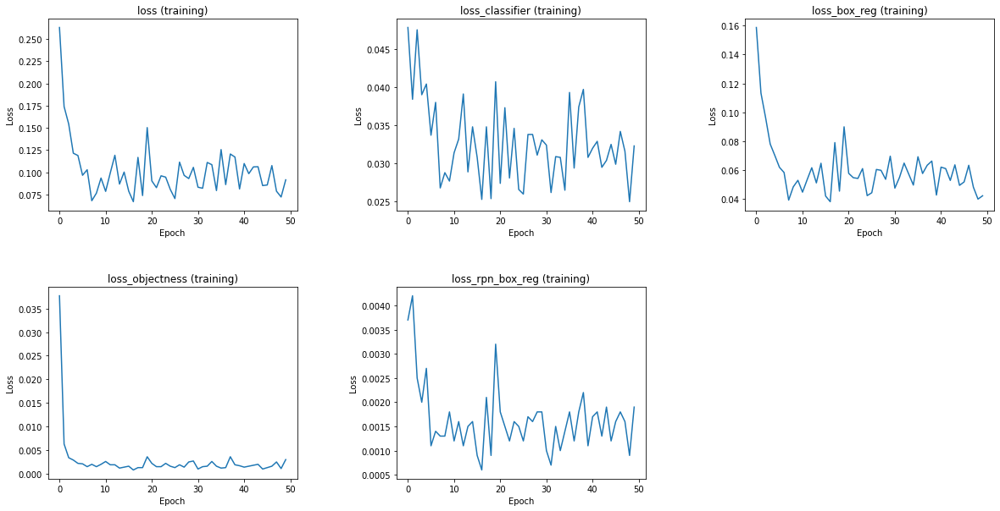

In [ ]:
metrics_attributes = ["loss", "loss_classifier", "loss_box_reg", "loss_objectness", "loss_rpn_box_reg"]

figure = plt.figure(figsize=(20,10))
figure.subplots_adjust(hspace=0.4, wspace=0.4)
cols, rows = 3, 2

for i in range(len(metrics)):
    ax = figure.add_subplot(rows, cols, i+1)
    # title and axis
    plt.title("{} (training)".format(metrics_attributes[i]))
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    ax.plot(metrics[i]) #data to plot

plt.show() #show plots

### 5b. Visualize the predicted bounding boxes

Give 8 images to the model and visualize the predicted bounding boxes.
* The last 4 images (first row) must show the ground truth bounding boxes and ALL the predicted bounding boxes;
* The first 4 images (second row) must show the ground truth bounding boxes and the predicted bounding boxes with a score greater than 0.8.

In [ ]:
image_ids2 = random.sample(range(len(test_set)), NUM_OF_IMGS)
image_ids3 = random.sample(range(len(test_set)), NUM_OF_IMGS)

In [ ]:
def display_predictions(img, bounding_boxes, prediction, all=True):
    # transform the image from tensor to PIL
    img_PIL = torchvision.transforms.ToPILImage()(img.squeeze(0))

    # draw image
    draw = ImageDraw.Draw(img_PIL)

    # draw groundtruth
    for box in range(len(bounding_boxes)): #for each bounding box in the groundtruth
        # draw it on the image
        draw.rectangle([(bounding_boxes[box][0], bounding_boxes[box][1]),
                        (bounding_boxes[box][2], bounding_boxes[box][3])], 
                      outline = "green", 
                      width = 3)

    # draw prediction
    predicted_boxes = prediction[0]["boxes"]
    predicted_scores = prediction[0]["scores"]

    for box in range(len(predicted_boxes)):
        # get the predicted bounding boxes
        boxes = predicted_boxes[box].detach().numpy()
        # get the scores (percentage) of the predicted bounding boxes
        score = np.round(predicted_scores[box].detach().numpy(), decimals= 4)
        if all:
            s = 0.0
        else:
            s = 0.8
        if score > s: 
            draw.rectangle([(boxes[0], boxes[1]), (boxes[2], boxes[3])], 
                          outline = "red", 
                          width = 3)
            # write the score of each predicted bounding box in the top left corner
            draw.text((boxes[0], boxes[1]), text = str(score))

    return img_PIL #show the image with the bounding boxes

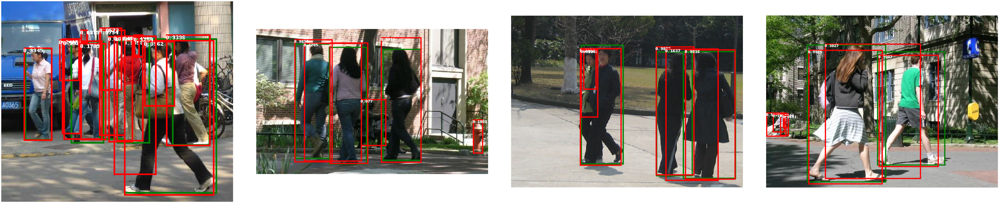

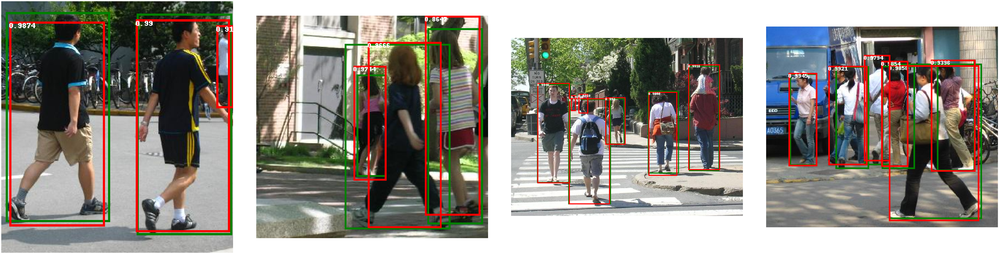

In [ ]:
# first row:
# ground truth bounding boxes and all the predicted bounding boxes
figure = plt.figure(figsize=(100, 100))
cols, rows = 4, 2

for i in range(len(image_ids2)):
    # get an image and its bounding box from the test set
    idx = image_ids2[i] 
    img, _ = test_set[idx]
    bounding_boxes = test_set[idx][1]["boxes"]

    # get predictions
    prediction = loaded_model([img])

    image_with_boxes = display_predictions(img, bounding_boxes, prediction)

    figure.add_subplot(rows, cols, i+1)
    plt.imshow(image_with_boxes)
    plt.axis('off')
plt.subplots_adjust(hspace=0.1, wspace=0.1)
plt.show()


# second row:
# ground truth bounding boxes and the predicted bounding boxes with a score greater than 0.8
figure = plt.figure(figsize=(100, 100))
cols, rows = 4, 2

for i in range(len(image_ids3)):
    # get an image and its bounding box from the test set
    idx = image_ids3[i] 
    img, _ = test_set[idx]
    bounding_boxes = test_set[idx][1]["boxes"]

    # get predictions
    prediction = loaded_model([img])

    image_with_boxes = display_predictions(img, bounding_boxes, prediction, all=False)

    figure.add_subplot(rows, cols, i+1)
    plt.imshow(image_with_boxes)
    plt.axis('off')
plt.subplots_adjust(hspace=0.1, wspace=0.1)
plt.show()

## Results, observations and conclusions

TODO

## Full code

TODO

---

## Bibliography
* [Torchvision Object Detection Finetuning Tutorial](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html)
* [Building your own object detector — PyTorch vs TensorFlow and how to even get started?](https://towardsdatascience.com/building-your-own-object-detector-pytorch-vs-tensorflow-and-how-to-even-get-started-1d314691d4ae)